In [7]:
import sys
from os import walk

# python libs
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import liana as li
from liana.method import rank_aggregate
#import decoupler as dc

import session_info

In [8]:
conditions = ['untreated1', 'asbestos', 'bleomycin']

In [9]:
directory = "/home/d/danilina/masterprak/data/liana_anndatas"
filenames = next(walk(directory), (None, None, []))[2]

merged_data_untreated_liana.h5ad


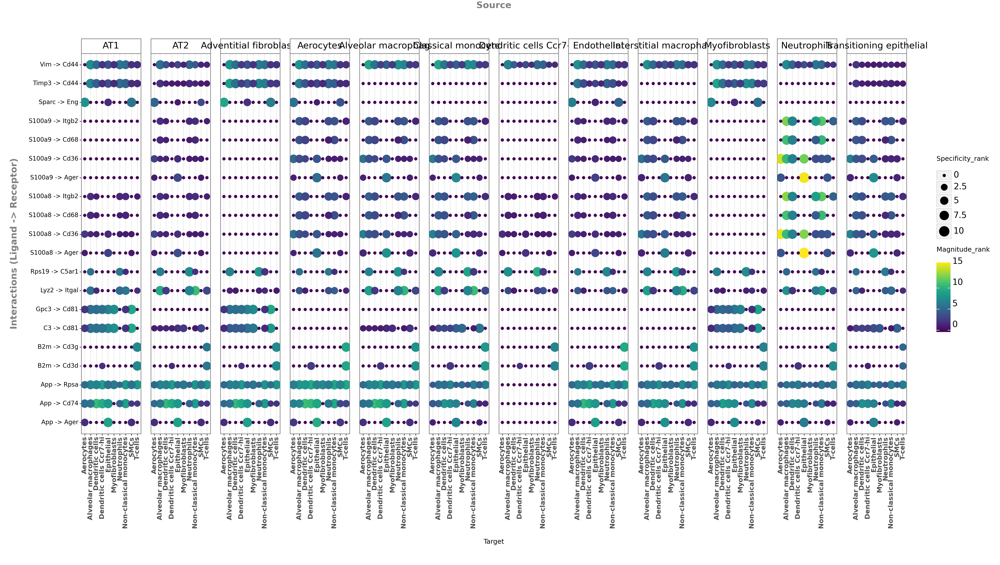


merged_data_saline_liana.h5ad


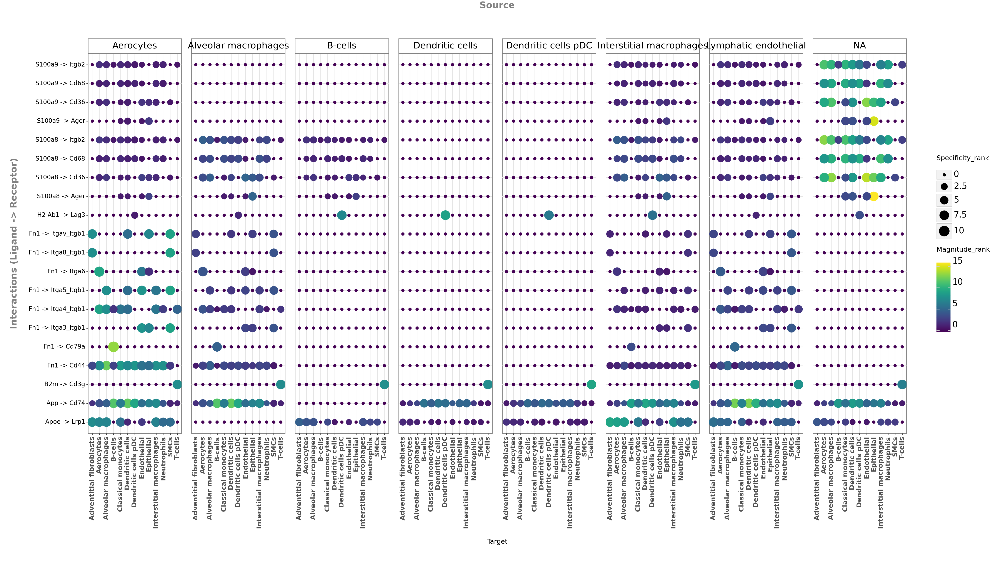


merged_data_bleomycin_liana.h5ad


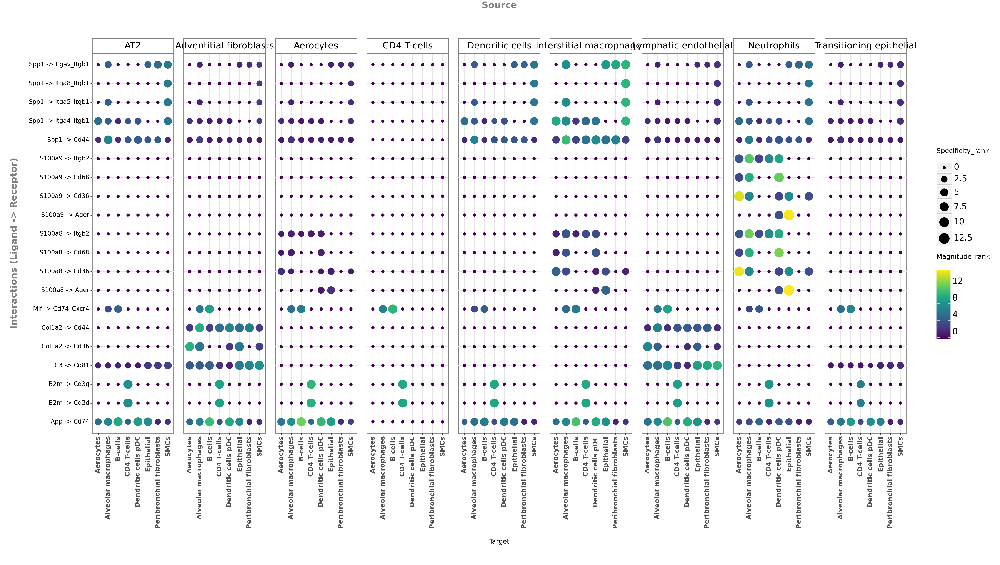


merged_data_asbestos_liana.h5ad


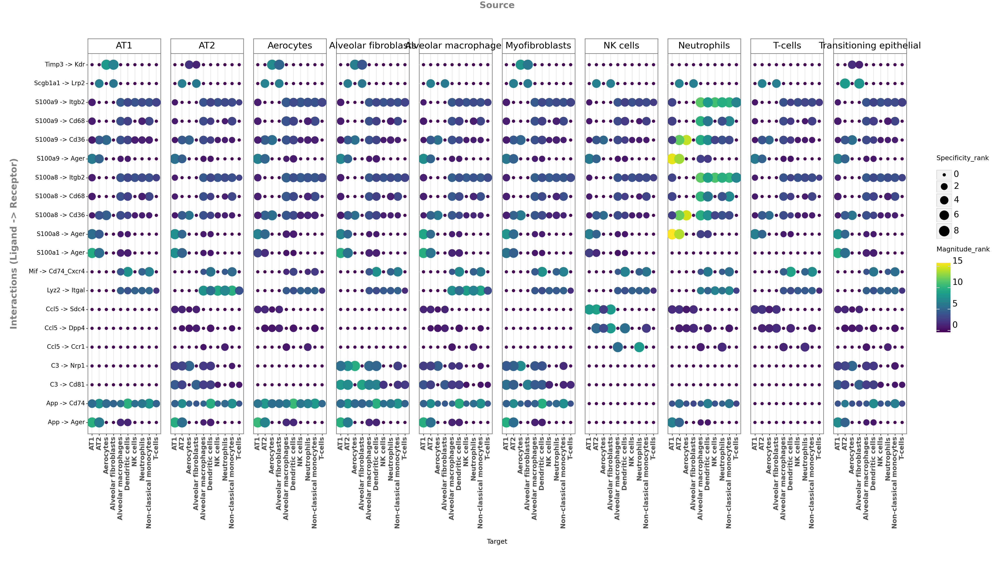


merged_data_untreated1_liana.h5ad


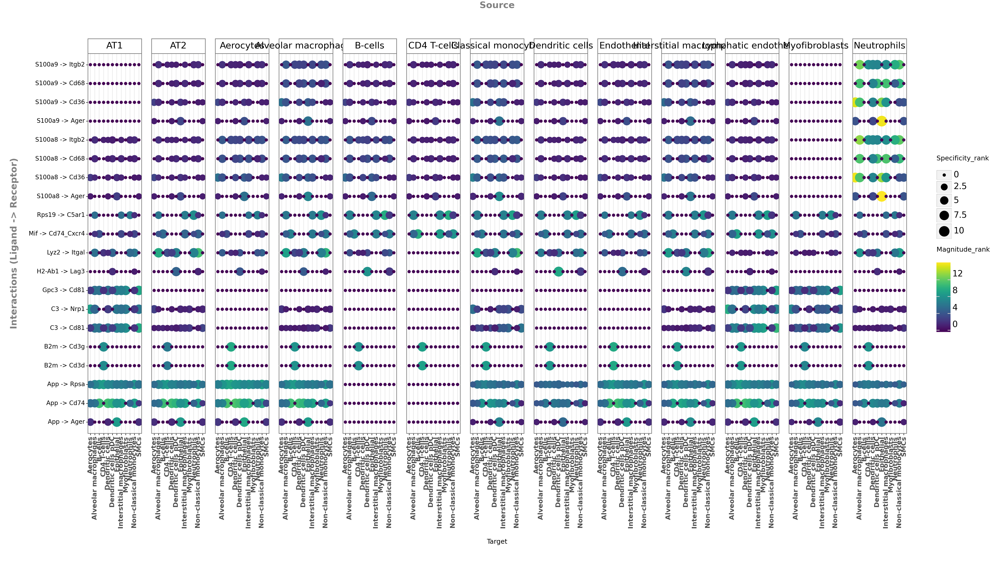

In [10]:
for file in [file for file in filenames if "merged" in file]:
    adata = sc.read(str(directory)+"/"+file)

    liana_res = adata.uns["liana_res"].drop_duplicates(["ligand_complex", "receptor_complex"]).sort_values(["magnitude_rank", "specificity_rank"],)

    # take top 20 interacting pairs of celltypes from liana results
    top_res = liana_res.drop_duplicates(["source", "target"])[:20]
    sender_celltypes = list(top_res.drop_duplicates("source").source)
    receiver_celltypes = list(top_res.drop_duplicates("target").target)

    fig = li.pl.dotplot(
            adata=adata,
            colour="magnitude_rank",
            size="specificity_rank",
            inverse_colour=True,  # we inverse sign since we want small p-values to have large sizes
            inverse_size=True,
            # We choose only the cell types which we wish to plot
            source_labels=sender_celltypes,
            target_labels=receiver_celltypes,
            # since the rank_aggregate can also be interpreted as a probability distribution
            # we can again filter them according to their specificity significance
            # yet here the interactions are filtered according to
            # how consistently highly-ranked is their specificity across the methods
            filterby="specificity_rank",
            filter_lambda=lambda x: x <= 0.05,
            # again, we can also further order according to magnitude
            orderby="magnitude_rank",
            orderby_ascending=True,  # prioritize those with lowest values
            top_n=20,  # and we want to keep only the top 20 interactions
            figure_size=(23, 13),
            #size_range=(1, 6),
            return_fig=True
        )  
    print(file)
    print(fig)
    #fig.save("./results/"+file[:-5]+"_"+cond+"_liana.png", dpi=500, limitsize=False)

top 10 pairs

merged_data_untreated_liana.h5ad


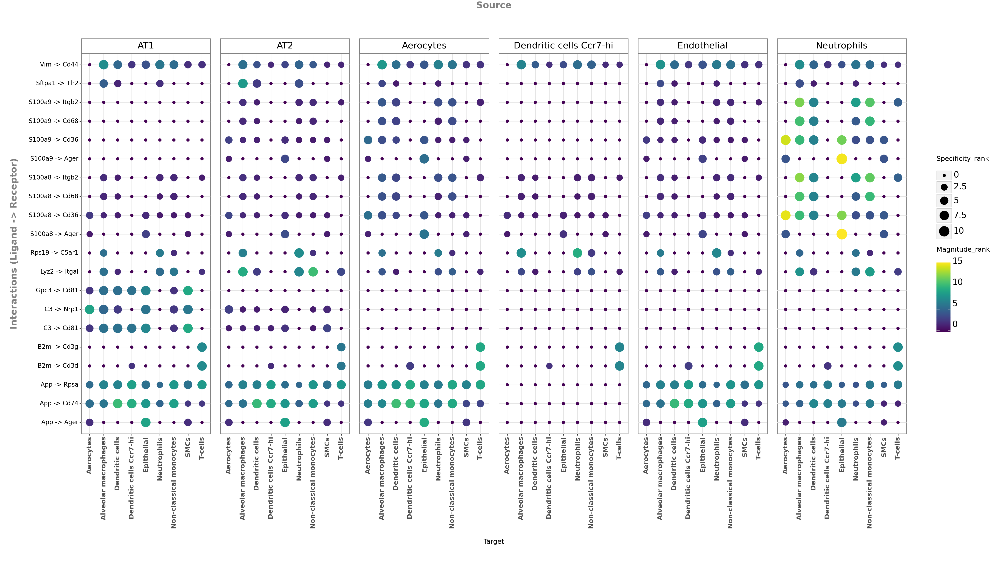


merged_data_saline_liana.h5ad


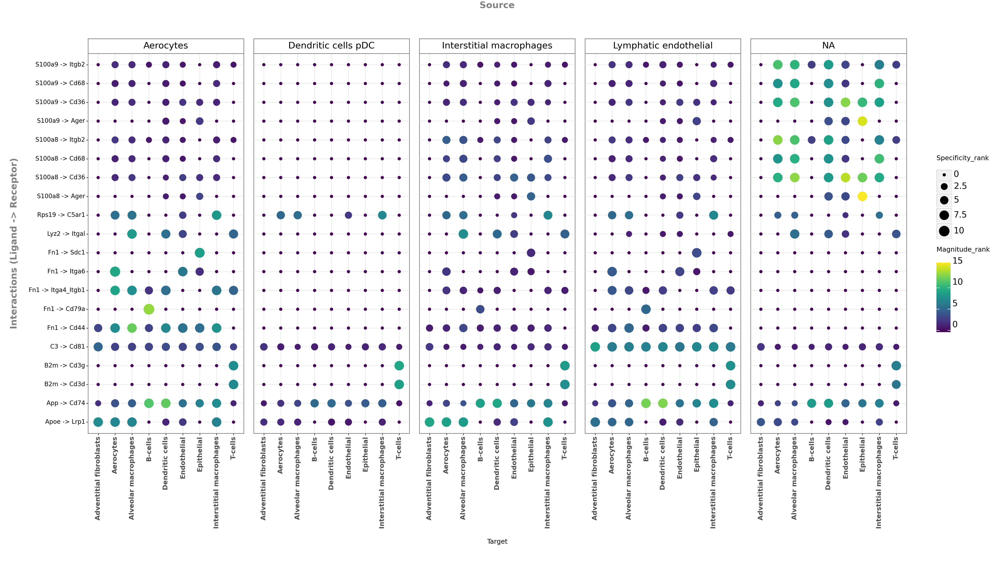


merged_data_bleomycin_liana.h5ad


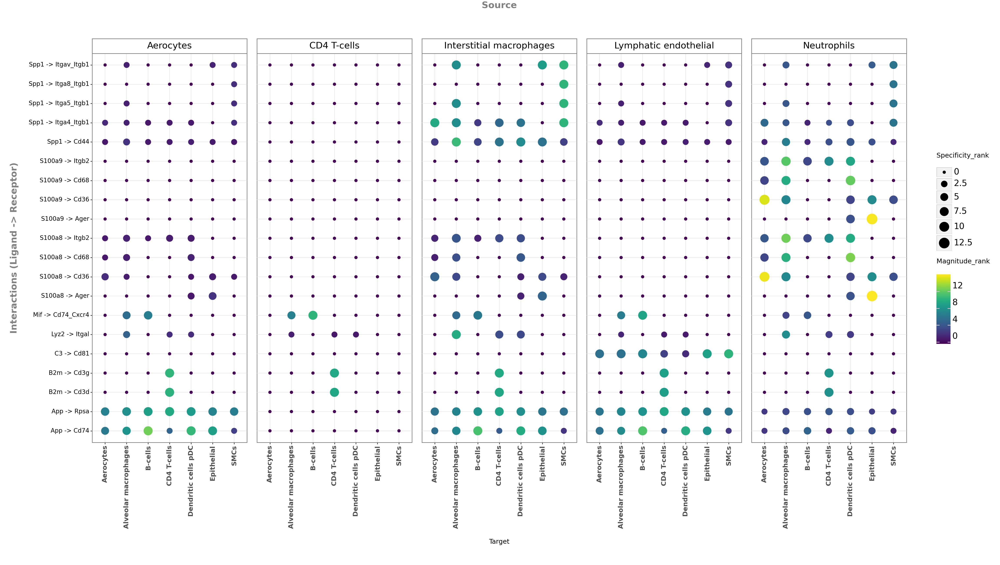


merged_data_asbestos_liana.h5ad


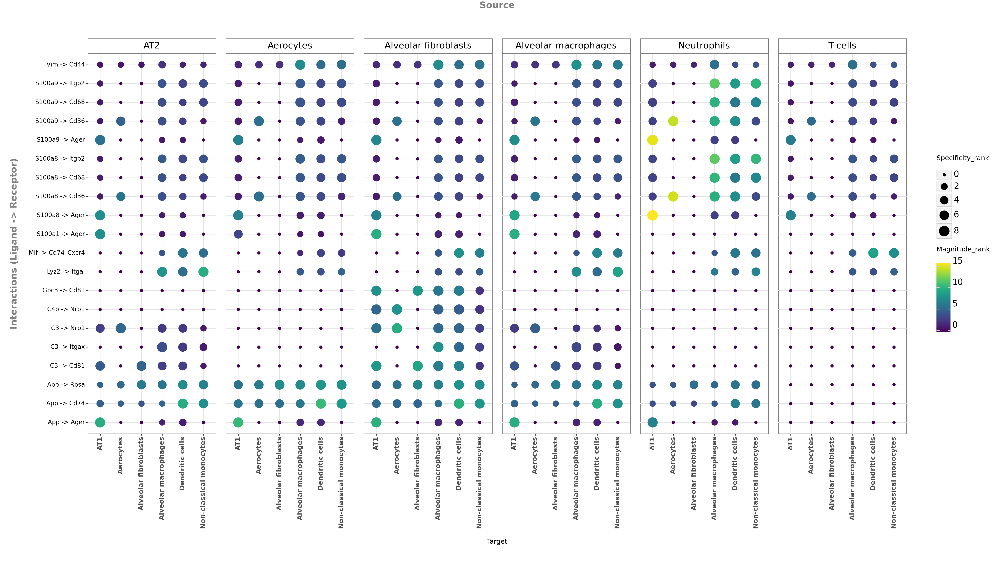


merged_data_untreated1_liana.h5ad


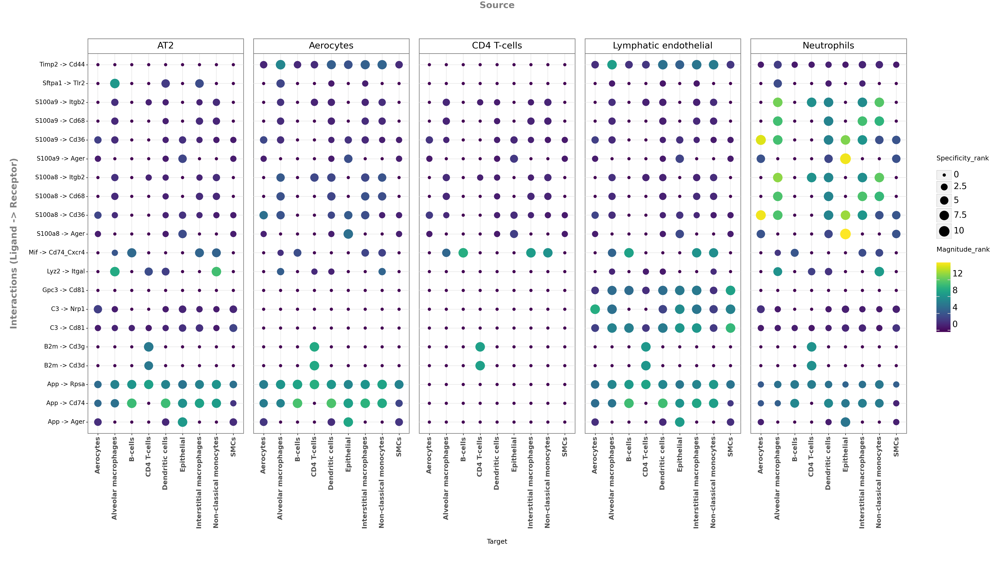

In [11]:
for file in [file for file in filenames if "merged" in file]:
    adata = sc.read(str(directory)+"/"+file)

    liana_res = adata.uns["liana_res"].drop_duplicates(["ligand_complex", "receptor_complex"]).sort_values(["magnitude_rank", "specificity_rank"],)

    # take top 20 interacting pairs of celltypes from liana results
    top_res = liana_res.drop_duplicates(["source", "target"])[:10]
    sender_celltypes = list(top_res.drop_duplicates("source").source)
    receiver_celltypes = list(top_res.drop_duplicates("target").target)

    fig = li.pl.dotplot(
            adata=adata,
            colour="magnitude_rank",
            size="specificity_rank",
            inverse_colour=True,  # we inverse sign since we want small p-values to have large sizes
            inverse_size=True,
            # We choose only the cell types which we wish to plot
            source_labels=sender_celltypes,
            target_labels=receiver_celltypes,
            # since the rank_aggregate can also be interpreted as a probability distribution
            # we can again filter them according to their specificity significance
            # yet here the interactions are filtered according to
            # how consistently highly-ranked is their specificity across the methods
            filterby="specificity_rank",
            filter_lambda=lambda x: x <= 0.05,
            # again, we can also further order according to magnitude
            orderby="magnitude_rank",
            orderby_ascending=True,  # prioritize those with lowest values
            top_n=20,  # and we want to keep only the top 20 interactions
            figure_size=(23, 13),
            #size_range=(1, 6),
            return_fig=True
        )  
    print(file)
    print(fig)
    #fig.save("./results/"+file[:-5]+"_"+cond+"_liana.png", dpi=500, limitsize=False)

merged_data_untreated_liana.h5ad


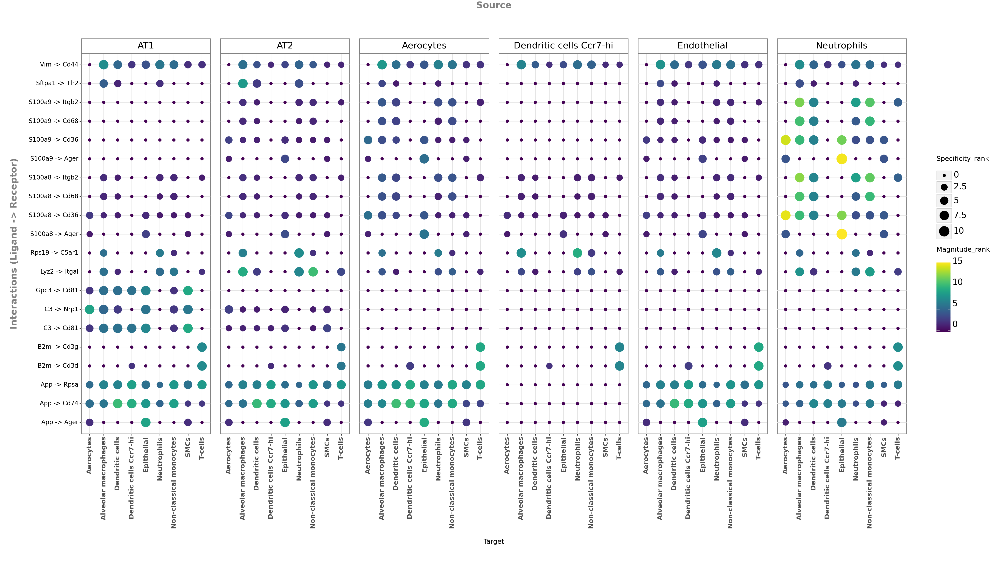


merged_data_saline_liana.h5ad


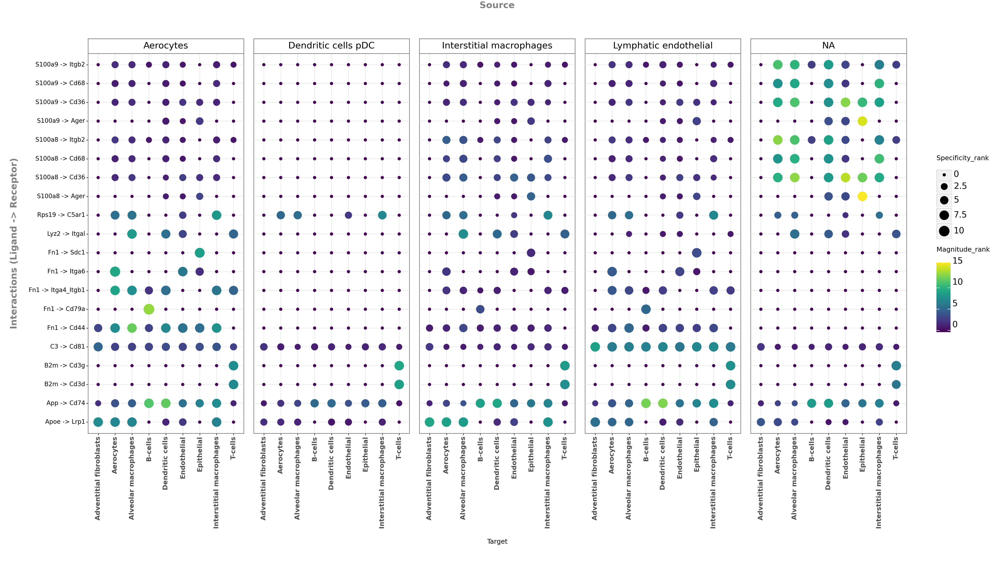


merged_data_bleomycin_liana.h5ad


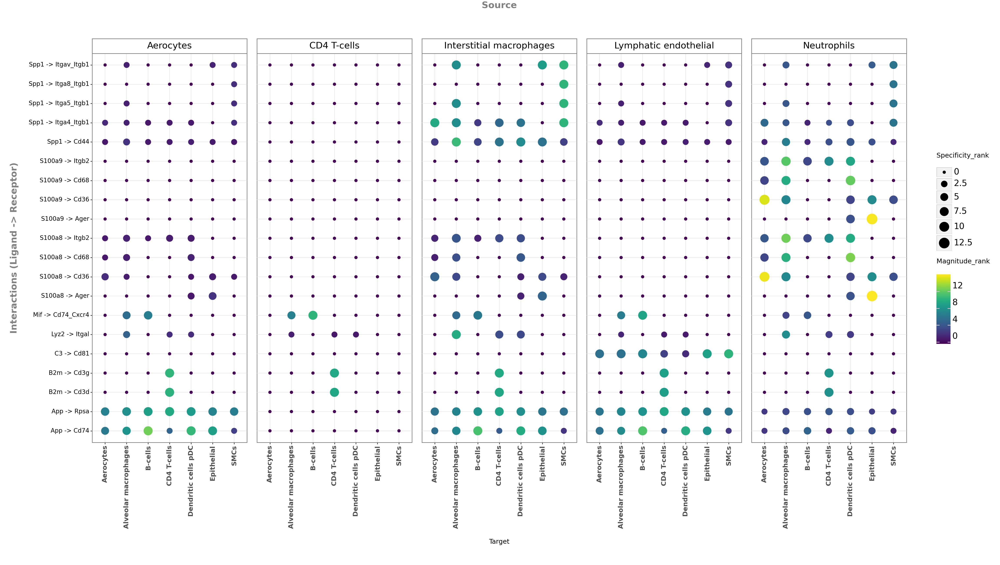


merged_data_asbestos_liana.h5ad


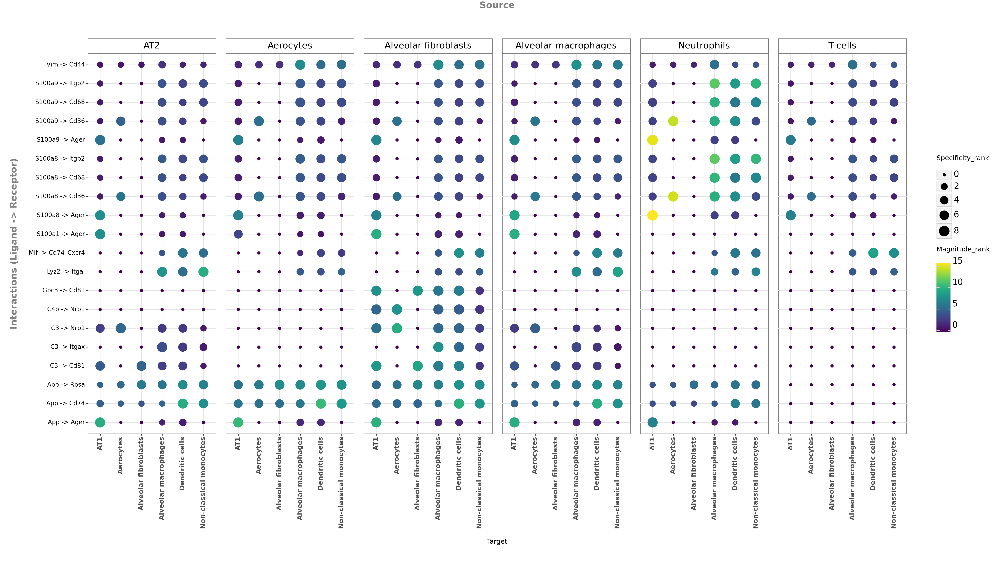


merged_data_untreated1_liana.h5ad


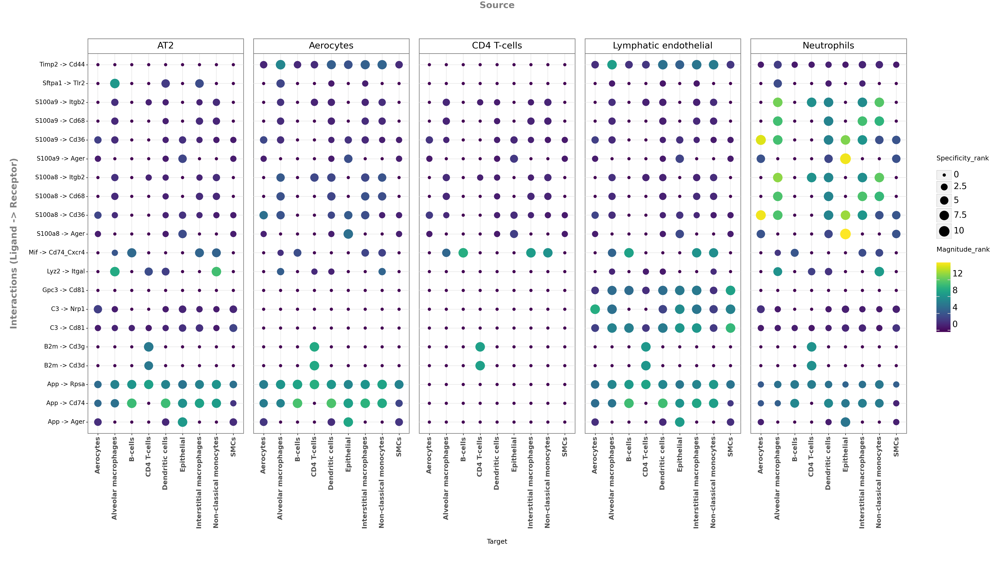

In [12]:
for file in [file for file in filenames if "merged" in file]:
    adata = sc.read(str(directory)+"/"+file)

    liana_res = adata.uns["liana_res"].drop_duplicates(["ligand_complex", "receptor_complex"]).sort_values(["magnitude_rank", "specificity_rank"],)

    # take top 20 interacting pairs of celltypes from liana results
    top_res = liana_res.drop_duplicates(["source", "target"])[:10]
    sender_celltypes = list(top_res.drop_duplicates("source").source)
    receiver_celltypes = list(top_res.drop_duplicates("target").target)

    fig = li.pl.dotplot(
            adata=adata,
            colour="magnitude_rank",
            size="specificity_rank",
            inverse_colour=True,  # we inverse sign since we want small p-values to have large sizes
            inverse_size=True,
            # We choose only the cell types which we wish to plot
            source_labels=sender_celltypes,
            target_labels=receiver_celltypes,
            # since the rank_aggregate can also be interpreted as a probability distribution
            # we can again filter them according to their specificity significance
            # yet here the interactions are filtered according to
            # how consistently highly-ranked is their specificity across the methods
            filterby="specificity_rank",
            filter_lambda=lambda x: x <= 0.05,
            # again, we can also further order according to magnitude
            orderby="magnitude_rank",
            orderby_ascending=True,  # prioritize those with lowest values
            top_n=20,  # and we want to keep only the top 20 interactions
            figure_size=(23, 13),
            #size_range=(1, 6),
            return_fig=True
        )  
    print(file)
    print(fig)
    #fig.save("./results/"+file[:-5]+"_"+cond+"_liana.png", dpi=500, limitsize=False)